# Correlation and GLM for daily R0 after Lockdown 

In [155]:
import os, sys
import csv, pickle, json
import datetime
import numpy as np
import pandas as pd
from patsy import dmatrices
import statsmodels.api as sm
from sklearn.metrics import r2_score
from datetime import timedelta

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline 

import seaborn as sns

import lightgbm as lgb
import shap

dataPath = "data/"

    

cities_spain = ["Madrid", "Barcelona", "Valencia", "Alicante", "Coruna", \
        "Zaragoza", "Sevilla", "Malaga", "Bilbao", "SantaCruz", "Granada"]
provinces_spain = ["Madrid", "Barcelona", "Valencia/València", "Alicante/Alacant", "Coruña, A", "Zaragoza",
                  "Sevilla", "Málaga", "Bizkaia", "Santa Cruz de Tenerife", "Granada"]
cities_spain_population = {"Madrid":6663, "Barcelona":5665, "Valencia":2565, "Alicante":1859, "Coruna":1120, \
        "Zaragoza":965, "Sevilla":1942, "Malaga":1662, "Bilbao":1153, "SantaCruz":1033, "Granada":915}  # population in province in thousands


cityColors = {"Madrid": "#990000", "Barcelona": "#C855F0", "Valencia": "#5a463f", \
    "Alicante": "#000000", "Coruna": "#145450", "Zaragoza": "#080358", \
    "Sevilla": "#2569b4", "Malaga": "#19a1db", "Bilbao": "#d51968",\
    "SantaCruz": "#a56405", "Granada": "#f7a81b",
    "LA": "#b41f24", "Atlanta": "#ef4b57",
    "Bogota": "#95ad05", "Boston": "#009145", "SFBay": "#207492",
    "Lisbon": "#5c2b7c", "Porto": "#ba2db3", "Rio": "#f7987f",
    "Shenzhen": "#1fc1b1", "Wuhan": "#b7583e", "Shanghai": "#4f4e4e"}

cityMarkers = {"Madrid": "o", "Barcelona": "s", "Valencia": "^", \
    "Alicante": "H", "Coruna": "D", "Zaragoza": "P", \
    "Sevilla": "<", "Malaga": "X", "Bilbao": "v",\
    "SantaCruz": "d", "Granada": "*",
    "LA": "o", "Atlanta": "s",
    "Bogota": "^", "Boston": "H", "SFBay": "D",
    "Lisbon": "P", "Porto": "<", "Rio": "X",
    "Shenzhen": "v", "Wuhan": "d", "Shanghai": "*"}

cityFaceColors = {"Madrid": "None", "Barcelona": "None", "Valencia": "None", \
    "Alicante": "None", "Coruna": "None", "Zaragoza": "None", \
    "Sevilla": "None", "Malaga": "None", "Bilbao": "None",\
    "SantaCruz": "None", "Granada": "None",
    "LA": "#b41f24", "Atlanta": "#ef4b57",
    "Bogota": "#95ad05", "Boston": "#009145", "SFBay": "#207492",
    "Lisbon": "#5c2b7c", "Porto": "#ba2db3", "Rio": "#f7987f",
    "Shenzhen": "#1fc1b1", "Wuhan": "#b7583e", "Shanghai": "#4f4e4e"}


def colors_from_values(values, palette_name, adaptive=False, minV=0, maxV=1):
    if adaptive==True:
        # normalize the values to range [0, 1]
        minV = min(values)
        maxV = max(values)
    normalized = (values - minV) / (maxV - minV)
    # convert to indices
    indices = np.round(normalized * (len(values) - 1)).astype(np.int32)
    # use the indices to get the colors
    palette = sns.color_palette(palette_name, len(values))
    return np.array(palette).take(indices, axis=0)


# N days before the current day (string), including the current day
def daysBeforeDate(dayStr, NDays):
    currentDay = datetime.datetime.strptime(dayStr, '%Y-%m-%d')
    allDays = [dayStr]
    for d in range(1,NDays):
        tmpDate = currentDay - timedelta(days=d)
        tmpDateStr = tmpDate.strftime('%Y-%m-%d')
        allDays.append(tmpDateStr)
    return allDays
        

In [2]:
def eval_on_batch_mape(pred, label):
    loss = np.abs(pred - label) / label
    return np.mean(loss)

def eval_on_batch_mae(pred, label):
    loss = np.abs(pred - label)
    return np.mean(loss)

def eval_on_batch_rmse(pred, label):
    loss = np.square(pred - label)
    loss = np.mean(loss)
    return np.sqrt(loss)

# Part 1. Load R0

In [158]:
# load province data
allData = []
startDay = "2020-02-15"
startDay_obj = datetime.datetime.strptime(startDay, '%Y-%m-%d')

weekIdxToDay0 = dict()
dayIdxToDate = dict()

# load the daily infection for each city
cityInfections = dict()
cityInfections_df = []

for city in cities_spain:
    cityInfections[city] = dict()  # date:num
    inData = open(dataPath + "Simulation/secondWave/R0_" + city + "_incidence_Oct.csv", "r")
    inData.readline()
    for row in inData:
        row = row.rstrip().split(",")
        day = row[1]
        incidence = int(row[3])
        inci_pop = incidence/cities_spain_population[city]  # daily cases / thousand population
        cityInfections[city][day] = [incidence, inci_pop]
        cityInfections_df.append([city, day, incidence, inci_pop])
    inData.close()
cityInfections_df = pd.DataFrame(cityInfections_df, columns=["city", "date", "Incidence", "Inci_pop"])
cityInfections_df['date'] = pd.to_datetime(cityInfections_df['date'])
cityInfections_df["NumCases"] = cityInfections_df.groupby(['city'])['Incidence'].cumsum()

# add 7-day average Incidence
for c in range(len(cities_spain)):
    city = cities_spain[c]
    province = provinces_spain[c]
    inData = open(dataPath + "Simulation/secondWave/R0_" + city + "_range_Oct.csv", "r")
    inData.readline()
    for row in inData:
        row = row.rstrip().split(",")
        day = row[0]
        currentDay = datetime.datetime.strptime(day, '%Y-%m-%d')
        delta = currentDay - startDay_obj
        dayIdx = delta.days
        dayIdxToDate[dayIdx] = day
        if day == "2020-03-14":
            dayIdx_LD = dayIdx
        weekIdx = dayIdx//7
        if weekIdx < 0:
            continue
        if dayIdx%7 == 0:
            weekIdxToDay0[weekIdx] = day
        
        month = int(day.split("-")[1])
        R0 = float(row[1])
        incidence, inci_pop = cityInfections[city][day]
        # collect date in 7-day window
        sevenDays = daysBeforeDate(day, 7)
        incidence_7d = []
        inci_pop_7d = []
        for dd in sevenDays:
            try:
                tmp1, tmp2 = cityInfections[city][dd]
                incidence_7d.append(tmp1)
                inci_pop_7d.append(tmp2)
            except:
                continue
        incidence_7d = np.mean(incidence_7d)
        inci_pop_7d = np.mean(inci_pop_7d)
        allData.append([city,day,month,dayIdx,weekIdx,R0,incidence,inci_pop,incidence_7d,inci_pop_7d])
    inData.close()

covid_data = pd.DataFrame(allData, columns=["city", "date", "month", "dayIdx", "weekIdx",
                                            "R0", "Incidence","Inci_pop","Incidence_7d","Inci_pop_7d"])
covid_data['date'] = pd.to_datetime(covid_data['date'])
covid_data['date_start'] = covid_data['date'] - timedelta(days=7)
covid_data = covid_data[covid_data['date'] > pd.to_datetime("2020-02-14")]
covid_data = covid_data[covid_data['date_start'] < pd.to_datetime("2020-10-01")]
covid_data.head()

,city,date,month,dayIdx,weekIdx,R0,Incidence,Inci_pop,Incidence_7d,Inci_pop_7d,date_start
0,Madrid,2020-02-15,2,0,0,1.220758,13,0.001951,10.714286,0.001608,2020-02-08
1,Madrid,2020-02-16,2,1,0,1.325194,15,0.002251,12.571429,0.001887,2020-02-09
2,Madrid,2020-02-17,2,2,0,1.281377,19,0.002852,13.571429,0.002037,2020-02-10
3,Madrid,2020-02-18,2,3,0,1.217063,14,0.002101,14.285714,0.002144,2020-02-11
4,Madrid,2020-02-19,2,4,0,1.125499,12,0.001801,14.285714,0.002144,2020-02-12


In [4]:
cityInfections_df

,city,date,Incidence,Inci_pop,NumCases
0,Madrid,2020-01-10,11,0.001651,11
1,Madrid,2020-01-11,1,0.000150,12
2,Madrid,2020-01-12,1,0.000150,13
3,Madrid,2020-01-13,2,0.000300,15
4,Madrid,2020-01-14,0,0.000000,15
...,...,...,...,...,...
2998,Granada,2020-11-09,629,0.687432,33678
2999,Granada,2020-11-10,859,0.938798,34537
3000,Granada,2020-11-11,3,0.003279,34540
3001,Granada,2020-11-12,0,0.000000,34540


In [159]:
covid_data

,city,date,month,dayIdx,weekIdx,R0,Incidence,Inci_pop,Incidence_7d,Inci_pop_7d,date_start
0,Madrid,2020-02-15,2,0,0,1.220758,13,0.001951,10.714286,0.001608,2020-02-08
1,Madrid,2020-02-16,2,1,0,1.325194,15,0.002251,12.571429,0.001887,2020-02-09
2,Madrid,2020-02-17,2,2,0,1.281377,19,0.002852,13.571429,0.002037,2020-02-10
3,Madrid,2020-02-18,2,3,0,1.217063,14,0.002101,14.285714,0.002144,2020-02-11
4,Madrid,2020-02-19,2,4,0,1.125499,12,0.001801,14.285714,0.002144,2020-02-12
...,...,...,...,...,...,...,...,...,...,...,...
2837,Granada,2020-10-03,10,231,33,1.153628,258,0.281967,226.714286,0.247775,2020-09-26
2838,Granada,2020-10-04,10,232,33,1.120958,142,0.155191,233.571429,0.255269,2020-09-27
2839,Granada,2020-10-05,10,233,33,1.149582,282,0.308197,250.857143,0.274161,2020-09-28
2840,Granada,2020-10-06,10,234,33,1.258526,511,0.558470,289.857143,0.316784,2020-09-29


In [6]:
weekIdxToDay0

{0: '2020-02-15',
 1: '2020-02-22',
 2: '2020-02-29',
 3: '2020-03-07',
 4: '2020-03-14',
 5: '2020-03-21',
 6: '2020-03-28',
 7: '2020-04-04',
 8: '2020-04-11',
 9: '2020-04-18',
 10: '2020-04-25',
 11: '2020-05-02',
 12: '2020-05-09',
 13: '2020-05-16',
 14: '2020-05-23',
 15: '2020-05-30',
 16: '2020-06-06',
 17: '2020-06-13',
 18: '2020-06-20',
 19: '2020-06-27',
 20: '2020-07-04',
 21: '2020-07-11',
 22: '2020-07-18',
 23: '2020-07-25',
 24: '2020-08-01',
 25: '2020-08-08',
 26: '2020-08-15',
 27: '2020-08-22',
 28: '2020-08-29',
 29: '2020-09-05',
 30: '2020-09-12',
 31: '2020-09-19',
 32: '2020-09-26',
 33: '2020-10-03',
 34: '2020-10-10',
 35: '2020-10-17',
 36: '2020-10-24',
 37: '2020-10-31',
 38: '2020-11-07',
 39: '2020-11-14'}

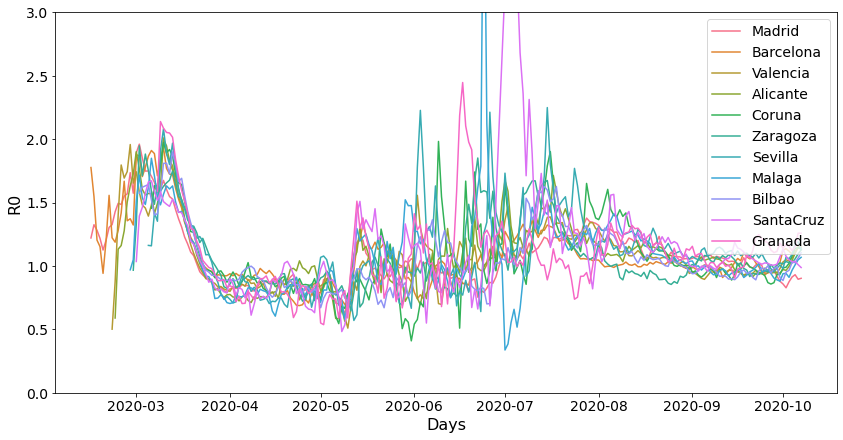

In [7]:
# plot
plt.figure(figsize=(14,7))
sns.lineplot(x="date", y="R0", hue='city', data=covid_data)
# plt.title(targetCity)
plt.ylim(0,3)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Days", fontsize=16)
plt.ylabel("R0", fontsize=16)
plt.legend(fontsize=14)

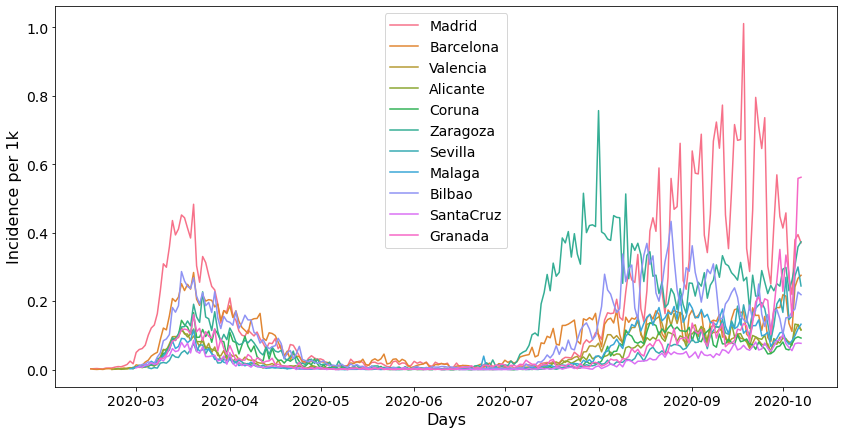

In [160]:
# plot
plt.figure(figsize=(14,7))
sns.lineplot(x="date", y="Inci_pop", hue='city', data=covid_data)
# plt.title(targetCity)
# plt.ylim(0,3)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Days", fontsize=16)
plt.ylabel("Incidence per 1k", fontsize=16)
plt.legend(fontsize=14)

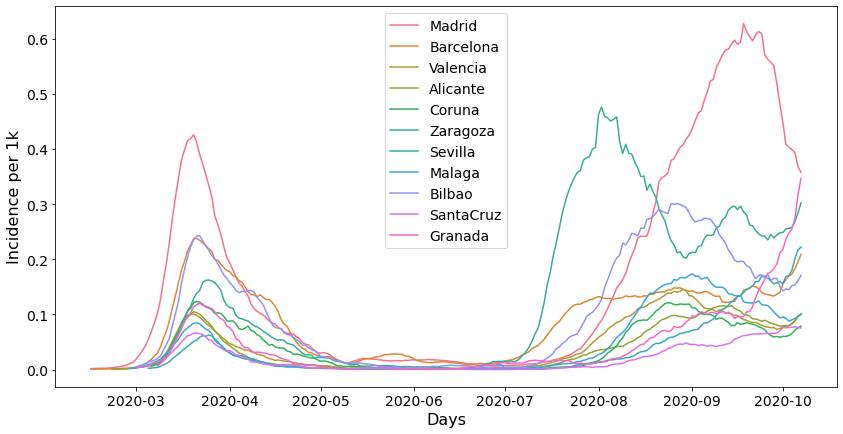

In [161]:
# plot
plt.figure(figsize=(14,7))
sns.lineplot(x="date", y="Inci_pop_7d", hue='city', data=covid_data)
# plt.title(targetCity)
# plt.ylim(0,3)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Days", fontsize=16)
plt.ylabel("Incidence per 1k", fontsize=16)
plt.legend(fontsize=14)

In [9]:
# list of all date from Feb. 16 to Sep. 30
allDays = []
allDays_str = []
firstDayIdx = []
firstDayInMonth = []

daysInMonth = {3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30}
# for d in range(16, 30):
    # allDays_str.append("2020-02-" + str(d).zfill(2))
    # allDays.append(pd.to_datetime("2020-02-" + str(d).zfill(2)))
for m in range(3,10):
    numDays = daysInMonth[m]
    for d in range(1, numDays+1):
        if d==1:
            firstDayIdx.append(len(allDays))
            firstDayInMonth.append(str(m).zfill(2) + "-01")
                
        allDays_str.append("2020-" + str(m).zfill(2) + "-" + str(d).zfill(2))
        allDays.append(pd.to_datetime("2020-" + str(m).zfill(2) + "-" + str(d).zfill(2)))

allDays = allDays[:-7]
# allDays = [pd.to_datetime("2020-02-29")] + allDays     
# Some days are missing in the CDR datasets
days_missing = ["2020-08-" + str(d).zfill(2) for d in [16,17,18,19,30]]
days_missing += ["2020-09-07"]

# days_missing = [pd.to_datetime(day) for day in days_missing]

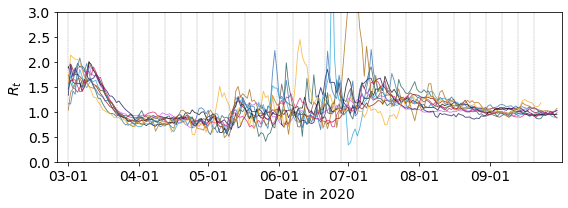

In [10]:
# plot Rt by day
fig = plt.figure(figsize=(8, 3))
ax = plt.subplot(1, 1, 1)
for city in cities_spain:
    cityData = covid_data[covid_data["city"] == city]
    cityData = cityData[cityData["date"] >= pd.Timestamp(2020,3,1)]
    cityData = cityData[cityData["date"] < pd.Timestamp(2020,10,1)]
    
    # sns.lineplot(x="date", y="Inci_pop", hue='city', data=cityData)
    allDays_str = cityData["date"].tolist()
    X = range(len(allDays_str))
    # Y = cityData["Inci_pop"].tolist()
    Y = cityData["R0"].tolist()
    # Y = [Y[i] if Y[i]>0 else np.nan for i in range(len(Y))]
    
    plt.plot(X, Y, # marker="o", 
        marker=cityMarkers[city], markersize=0.0,
        markeredgecolor=cityColors[city], markeredgewidth=1, \
        markerfacecolor='#ffffff', linewidth=0.85, c=cityColors[city], \
        alpha=0.75, label=city)

# plot line every week
plotMinV = 0
plotMaxV = 3
for d in range(len(allDays_str)):
    if d%7 != 0:
        continue
    plt.plot([d,d], [plotMinV, plotMaxV], lw=0.3, linestyle="--", c="#666666")

# lockdownIdx = allDays_str.index("2020-03-14")
# plt.plot([lockdownIdx,lockdownIdx], [plotMinV, plotMaxV], lw=1.5, linestyle="--", c="k")

# plt.ticklabel_format(axis="both", style="", scilimits=(0,0))
plt.xlim(-5, 215)
plt.ylim(0, 3)
plt.xticks(firstDayIdx, firstDayInMonth, fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Date in 2020", fontsize=14)
plt.ylabel(r"$R_t$", fontsize=14)
# plt.ylabel(r"Incidence per 1k", fontsize=14)
# plt.ylabel(r"Accumulated cases", fontsize=14)
# plt.yscale("log")

# plt.legend(loc="upper right", frameon=False, fontsize=12)
plt.tight_layout()
# plt.savefig(dataPath + 'Simulation/2021/city_IncidencePer1k_log.pdf')
# plt.savefig(dataPath + 'Simulation/2021/city_AccumCases_log.pdf')
# plt.savefig(dataPath + 'Simulation/2021/city_R0.pdf')
# plt.close()

# data collection
### For each city per day, we have R0 as response.
### Inputs (18 predictors): 

In [11]:
cityInfo = pickle.load(open(dataPath + "results/cityInfo_all.pkl", "rb"))
# cityRadius, totalPop, giniPop, giniPop_over500, meanPop, crowdingPop, avgGyration, stdGyration = cityInfo[city]
city_deltaKS_typ = pickle.load(open(dataPath + "results/cityA2values.pkl", "rb"))
allDays_, cities_KS_HBT, cities_deltaKS, _, cities_avgRgs = \
        pickle.load(open(dataPath + "results/cities_KS_change_woZero_2020.pkl", "rb"))

cities_deltaKS_dict = dict()
cities_KS_HBT_dict = dict()
cities_avgRgs_dict = dict()
for city in cities_spain:
    cities_deltaKS_dict[city] = dict()
    cities_avgRgs_dict[city] = dict()
    cities_KS_HBT_dict[city] = dict()

# slope of ks by city and day
# 7-day average before current
for d in range(6, len(allDays_)):
    day = allDays_[d]
    for city in cities_spain:
        deltaKS_week = cities_deltaKS[city][d-6:d+1]
        cities_deltaKS_dict[city][day] = np.nanmean(deltaKS_week)
        avgRgs_week = cities_avgRgs[city][d-6:d+1]
        cities_avgRgs_dict[city][day] = np.nanmean(avgRgs_week) 
        KS_HBT_week = cities_KS_HBT[city][d-6:d+1]
        cities_KS_HBT_dict[city][day] = np.nanmean(KS_HBT_week)

# 14-day average before current
# for d in range(13, len(allDays)):
#     day = allDays[d]
#     for city in cities_spain:
#         deltaKS_week = cities_deltaKS[city][d-13:d+1]
#         cities_deltaKS_dict[city][day] = deltaKS_week
#         avgRgs_week = cities_avgRgs[city][d-13:d+1]
#         cities_avgRgs_dict[city][day] = avgRgs_week 
#         KS_HBT_week = cities_KS_HBT[city][d-13:d+1]
#         cities_KS_HBT_dict[city][day] = KS_HBT_week

# 7-day average after current
# for d in range(len(allDays)-6):
#     day = allDays[d]
#     for city in cities_spain:
#         deltaKS_week = cities_deltaKS[city][d:d+7]
#         cities_deltaKS_dict[city][day] = deltaKS_week
#         avgRgs_week = cities_avgRgs[city][d:d+7]
#         cities_avgRgs_dict[city][day] = avgRgs_week 
#         KS_HBT_week = cities_KS_HBT[city][d:d+7]
#         cities_KS_HBT_dict[city][day] = KS_HBT_week

# current
# for d in range(len(allDays)):
#     day = allDays[d]
#     for city in cities_spain:
#         deltaKS_week = cities_deltaKS[city][d]
#         cities_deltaKS_dict[city][day] = deltaKS_week
#         avgRgs_week = cities_avgRgs[city][d]
#         cities_avgRgs_dict[city][day] = avgRgs_week 
#         KS_HBT_week = cities_KS_HBT[city][d]
#         cities_KS_HBT_dict[city][day] = KS_HBT_week

In [12]:
print(allDays_[:10])

['2020-02-01', '2020-02-02', '2020-02-03', '2020-02-04', '2020-02-05', '2020-02-06', '2020-02-07', '2020-02-08', '2020-02-09', '2020-02-10']


## model covid_data_afterLD with urban and mobility variales

In [162]:

# Some days are missing in the CDR datasets
days_missing = ["2020-08-" + str(d).zfill(2) for d in [16,17,18,19,30]]
days_missing += ["2020-09-07"]

allData_daily = []

for i, row in covid_data.iterrows(): 
    city = row["city"]
    day_pd = row["date"]
    if day_pd >= pd.to_datetime("2020-10-01"):
        continue
    if day_pd < pd.to_datetime("2020-02-07"):
        continue
    day =  str(row["date"]).split(" ")[0]
    month = int(day.split("-")[1])
    if day in days_missing:
        # print(day)
        continue

    R0 = row["R0"]
    Inci_pop = row["Inci_pop"]
    Inci_pop_7d = row["Inci_pop_7d"]
    # print(city, day)
    # print()
    deltaKS_typ = city_deltaKS_typ[city]
    totalPop = cityInfo[city][1]
    logPop = np.log10(totalPop)
    Gini = cityInfo[city][3]
    meanPop = cityInfo[city][4]
    Crowding = cityInfo[city][5]
    Crowding_rel = Crowding / meanPop
    avgRgs = cityInfo[city][6]
    stdRgs = cityInfo[city][7]
    deltaKS_week = cities_deltaKS_dict[city][day]
    avgRgs_week = cities_avgRgs_dict[city][day]
    KS_HBT_week = cities_KS_HBT_dict[city][day]
    allData_daily.append([city, day_pd, R0, Inci_pop, Inci_pop_7d, totalPop, logPop, Gini, Crowding, avgRgs, deltaKS_typ] + \
                              [avgRgs_week, deltaKS_week, KS_HBT_week])

column_names = ["city", "date", "R0", "Inci_pop", "Inci_pop_7d", "totalPop", "logPop", "Gini", "Crowding", "avgRgs", "deltaKS", \
                   "avgRgs_week", "deltaKS_week", "KS_HBT_week"]
allData_daily = pd.DataFrame(allData_daily, columns=column_names)
allData_daily["datetime"] = pd.to_datetime(allData_daily["date"],format='%Y-%m-%d')
# normalize Rg
# allData_daily["avgRgs_week_normalized"] = np.divide(allData_daily["avgRgs_week"], allData_daily["avgRgs"])
allData_daily["avgRgs_week_normalized"] = np.divide(allData_daily["avgRgs_week"], np.max(allData_daily["avgRgs_week"]))
allData_daily

,city,date,R0,Inci_pop,Inci_pop_7d,totalPop,logPop,Gini,Crowding,avgRgs,deltaKS,avgRgs_week,deltaKS_week,KS_HBT_week,datetime,avgRgs_week_normalized
0,Madrid,2020-02-15,1.220758,0.001951,0.001608,6101856,6.785462,0.500932,7961.913255,12.715986,0.272842,5.400105,0.369668,0.787498,2020-02-15,0.498871
1,Madrid,2020-02-16,1.325194,0.002251,0.001887,6101856,6.785462,0.500932,7961.913255,12.715986,0.272842,5.467481,0.373587,0.789132,2020-02-16,0.505095
2,Madrid,2020-02-17,1.281377,0.002852,0.002037,6101856,6.785462,0.500932,7961.913255,12.715986,0.272842,5.448813,0.375987,0.788635,2020-02-17,0.503371
3,Madrid,2020-02-18,1.217063,0.002101,0.002144,6101856,6.785462,0.500932,7961.913255,12.715986,0.272842,5.453370,0.377144,0.788716,2020-02-18,0.503792
4,Madrid,2020-02-19,1.125499,0.001801,0.002144,6101856,6.785462,0.500932,7961.913255,12.715986,0.272842,5.457322,0.378552,0.788885,2020-02-19,0.504157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2314,Granada,2020-09-26,1.183607,0.202186,0.174083,535776,5.728983,0.466265,6325.062450,12.896935,0.300203,5.085818,0.675843,0.788437,2020-09-26,0.469837
2315,Granada,2020-09-27,1.125616,0.102732,0.177205,535776,5.728983,0.466265,6325.062450,12.896935,0.300203,5.140399,0.675308,0.788885,2020-09-27,0.474879
2316,Granada,2020-09-28,1.105007,0.175956,0.182670,535776,5.728983,0.466265,6325.062450,12.896935,0.300203,5.177877,0.674047,0.789264,2020-09-28,0.478341
2317,Granada,2020-09-29,1.114817,0.260109,0.191569,535776,5.728983,0.466265,6325.062450,12.896935,0.300203,5.229820,0.671670,0.789187,2020-09-29,0.483140


# GBM for daily R0 by city

In [232]:
# define gbm model
# specify your configurations as a dict
'''
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_iterations': 200000,
    'num_leaves': 500,
    'max_bin': 255,
    'max_depth': 200,
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 20,
    'early_stopping_rounds': 50,
    'verbose': 0,
    'num_threads': 6
}
'''

'''
# fit R0 for each city
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_iterations': 10000,
    'num_leaves': 50,
    'max_bin': 200,
    'max_depth': 100,
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.7,
    'bagging_freq': 20,
    'early_stopping_rounds': 50,
    'verbose': 0,
    'num_threads': 8
}
'''

'''
# fit Inci_pop for each city
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_iterations': 10000,
    'num_leaves': 50,
    'max_bin': 150,
    'max_depth': 50,
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 20,
    'early_stopping_rounds': 50,
    'verbose': 0,
    'num_threads': 8
}
'''

# fit Inci_pop for each stage
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_iterations': 10000,
    'num_leaves': 50,
    'max_bin': 150,
    'max_depth': 50,
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 20,
    'early_stopping_rounds': 50,
    'verbose': 0,
    'num_threads': 8
}

In [276]:
# model GBM for each phase
data_city = allData_daily


# phase 1
df_train = data_city[data_city["datetime"] < pd.to_datetime("2020-05-01")]

# phase 2
# df_train = data_city[data_city["datetime"] >= pd.to_datetime("2020-05-01")]
# df_train = df_train[df_train["datetime"] < pd.to_datetime("2020-07-01")]

# phase 3
# df_train = df_train[df_train["datetime"] >= pd.to_datetime("2020-07-01")]
# remove abnormal Rt>6
# df_train = data_city[data_city["R0"] < 6.0]

# all phases
# df_train = data_city

y_train = df_train["R0"]  # df_train["Inci_pop"]
print(df_train.size)
    
X_train = df_train[["logPop", "Gini", "avgRgs", "deltaKS", "avgRgs_week", "deltaKS_week", "KS_HBT_week"]]
# X_test = df_test[["logPop", "Gini", "avgRgs", "deltaKS", "avgRgs_week_normalized", "deltaKS_week", "KS_HBT_week"]]


# create dataset for lightgbm
lgb_train = lgb.Dataset(X_train, y_train)

print('Starting training...')
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=20,
                valid_sets=lgb_train)

print('Checking training performance...')
# predict
y_train_pred = gbm.predict(X_train, num_iteration=gbm.best_iteration)
# eval
print('The rmse of prediction is:', eval_on_batch_rmse(y_train, y_train_pred))
print('The r2 of prediction is:', r2_score(y_train, y_train_pred))
print('The mape of prediction is:', eval_on_batch_mape(y_train, y_train_pred))

r2_model = r2_score(y_train, y_train_pred)

11232
Starting training...
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	training's l1: 0.317152	training's l2: 0.135397
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	training's l1: 0.315699	training's l2: 0.134262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	training's l1: 0.314253	training's l2: 0.133138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	training's l1: 0.312819	training's l2: 0.132028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	training's l1: 0.31139	training's l2: 0.130914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	training's l1: 0.309972	training's

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


[166]	training's l1: 0.162212	training's l2: 0.0414851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	training's l1: 0.161662	training's l2: 0.0412537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	training's l1: 0.161116	training's l2: 0.0410246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	training's l1: 0.160573	training's l2: 0.040796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	training's l1: 0.160032	training's l2: 0.0405713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	training's l1: 0.15948	training's l2: 0.0403453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[172]	training's l1: 0.158935	training's l2: 0.0401233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[173]	training's l1: 0.15839	training's l2: 0.0399017
[LightGBM] [Warning] No further splits

In [277]:
y_train_pred = gbm.predict(X_train, num_iteration=gbm.best_iteration)
y_train_pred = y_train_pred.clip(min=0)
# y_train_pred

Text(0, 0.5, 'modeled')

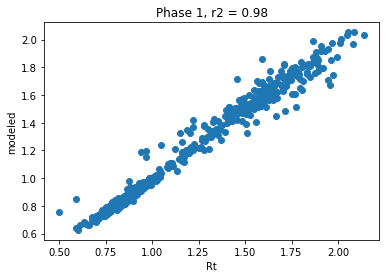

In [278]:
plt.scatter(y_train,y_train_pred)
# plt.xlim(0,5)
# plt.ylim(0,5)
plt.title("Phase 1" + ", r2 = %.2f" % r2_model)
# plt.xlabel("Inci_pop")
plt.xlabel("Rt")
plt.ylabel("modeled")

In [279]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(gbm)
shap_values = explainer(X_train)

In [280]:
# average Rt
avgRt = np.mean(y_train)
print(avgRt)
print(len(shap_values))
print(X_train.shape)
print(list(np.mean(np.abs(shap_values.values),0)))

print("")
print(list(np.mean(np.abs(shap_values.values),0) / avgRt))

1.101896667726372
702
(702, 7)
[0.011661715933291137, 0.01677071740340102, 0.007880585594548744, 0.018674572863572894, 0.19836776516084415, 0.045444144959333944, 0.1204736580868907]

[0.010583311734079068, 0.015219863980535786, 0.00715183721429103, 0.016947662526383328, 0.1800239268988367, 0.04124174824223976, 0.10933299066551608]


Text(0.5, 1.0, 'Phase 1, r2 = 0.98')

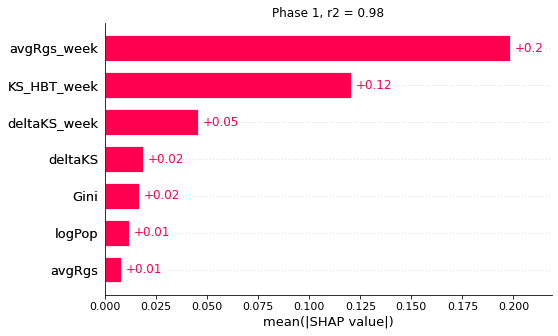

In [281]:
# visualize the first prediction's explanation
fig = plt.figure(figsize=(4,3))
# shap.plots.waterfall(shap_values[0])
shap.plots.bar(shap_values, show=False)
plt.title("Phase 1" + ", r2 = %.2f" % r2_model)
# plt.savefig(dataPath + 'results/GBM/shap_Rt_' + 'phase0' + '_bar.pdf',dpi=150, bbox_inches='tight')
# plt.savefig(dataPath + 'results/GBM/shap_Rt_' + 'phase0' + '_bar.png',dpi=150, bbox_inches='tight')

In [282]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(gbm)
shap_values = explainer(X_train)

In [283]:
print(shap_values.feature_names)
# shap_values.feature_names = [r'logPop', 'Gini', r'$\overline{Rg}_{typ}$', r'$\Delta KS_{typ}$', 
#                              r'\overline{Rg}^{7d}_{norm}', r'\Delta KS^{7d}', r'KS_{HBT}^{7d}']
# print(shap_values.feature_names)

['logPop', 'Gini', 'avgRgs', 'deltaKS', 'avgRgs_week', 'deltaKS_week', 'KS_HBT_week']


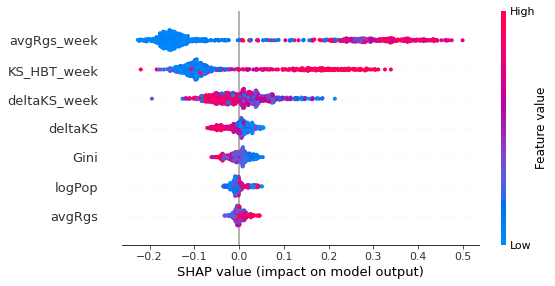

In [284]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values, show=False)
# plt.savefig(dataPath + 'results/GBM/shap_Rt_' + "Phase3" + '_beeswarm02.pdf',dpi=150, bbox_inches='tight')

# SHAP by city

In [388]:
cityFeatureImp = []

for targetCity in cities_spain:

    # print(targetCity)

    data_city = allData_daily[allData_daily["city"]==targetCity]

    df_train = data_city

    y_train = df_train["Inci_pop"]
    # print(df_train.size)

    # by city
    X_train = df_train[["avgRgs_week", "deltaKS_week", "KS_HBT_week"]]


    # create dataset for lightgbm
    lgb_train = lgb.Dataset(X_train, y_train)

    # print('Starting training...')
    # train
    gbm = lgb.train(params,
                    lgb_train,
                    num_boost_round=20,
                    valid_sets=lgb_train)

    # print('Saving model...')
    # save model to file
    curTime = "%s" % datetime.datetime.now()
    gbm.save_model(dataPath + 'results/GBM/gbm_' + targetCity + '.txt')

    # print('Checking training performance...')
    # predict
    y_train_pred = gbm.predict(X_train, num_iteration=gbm.best_iteration)
    # eval
    # print('The r2 of prediction is:', r2_score(y_train, y_train_pred))
    r2_model = r2_score(y_train, y_train_pred)
    
    # explain the model's predictions using SHAP
    # (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
    explainer = shap.Explainer(gbm)
    shap_values = explainer(X_train)
    
    # feature importance with SHAP
    featureImportance = np.mean(np.abs(shap_values.values),0)  # ["avgRgs_week", "deltaKS_week", "KS_HBT_week"]
    row = [targetCity, r2_model] + list(featureImportance)
    cityFeatureImp.append(row)
    print(row)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	training's l1: 0.166074	training's l2: 0.0443119
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	training's l1: 0.16558	training's l2: 0.0440744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	training's l1: 0.165094	training's l2: 0.0438394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	training's l1: 0.164611	training's l2: 0.0436068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	training's l1: 0.164129	training's l2: 0.0433764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	training's l1: 0.16365	training's l2: 0.0431485
[LightGB

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument



[449]	training's l1: 0.0402513	training's l2: 0.00271176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	training's l1: 0.0402474	training's l2: 0.00271066
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	training's l1: 0.0402314	training's l2: 0.00270927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	training's l1: 0.0402244	training's l2: 0.00270819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	training's l1: 0.0402084	training's l2: 0.00270683
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	training's l1: 0.0401925	training's l2: 0.00270548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	training's l1: 0.0401856	training's l2: 0.00270443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	training's l1: 0.0401698	training's l2: 0.00270311
[LightGBM] [Warnin

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


No further splits with positive gain, best gain: -inf
[466]	training's l1: 0.0212515	training's l2: 0.000793237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	training's l1: 0.0212416	training's l2: 0.000792712
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	training's l1: 0.0212308	training's l2: 0.000792161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	training's l1: 0.021221	training's l2: 0.000791646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	training's l1: 0.0212103	training's l2: 0.000791105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	training's l1: 0.0212006	training's l2: 0.0007906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	training's l1: 0.02119	training's l2: 0.00079007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	training's l1: 

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


[460]	training's l1: 0.0178216	training's l2: 0.000588884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	training's l1: 0.0178045	training's l2: 0.000587855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	training's l1: 0.0177875	training's l2: 0.000586837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	training's l1: 0.0177714	training's l2: 0.00058583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	training's l1: 0.0177554	training's l2: 0.000584834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	training's l1: 0.0177395	training's l2: 0.000583849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	training's l1: 0.0177235	training's l2: 0.000582846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	training's l1: 0.0177077	training's l2: 0.000581881
[LightGBM] [

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument



[455]	training's l1: 0.0257601	training's l2: 0.00101826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	training's l1: 0.0257508	training's l2: 0.00101792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	training's l1: 0.025737	training's l2: 0.00101739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	training's l1: 0.0257278	training's l2: 0.00101705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	training's l1: 0.0257187	training's l2: 0.00101672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	training's l1: 0.0257096	training's l2: 0.0010164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	training's l1: 0.0256969	training's l2: 0.00101546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	training's l1: 0.025684	training's l2: 0.0010145
[LightGBM] [Warning] N

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[526]	training's l1: 0.0534258	training's l2: 0.00555562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[527]	training's l1: 0.053393	training's l2: 0.00555278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[528]	training's l1: 0.0533604	training's l2: 0.00554997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[529]	training's l1: 0.0533279	training's l2: 0.0055472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[530]	training's l1: 0.0532956	training's l2: 0.00554447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[531]	training's l1: 0.0532635	training's l2: 0.00554177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[532]	training's l1: 0.0532315	training's l2: 0.00553911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


[443]	training's l1: 0.0225392	training's l2: 0.000970801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	training's l1: 0.0225281	training's l2: 0.000970343
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	training's l1: 0.0225171	training's l2: 0.00096989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	training's l1: 0.0225061	training's l2: 0.000969442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	training's l1: 0.0224954	training's l2: 0.000969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	training's l1: 0.0224848	training's l2: 0.000968562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[449]	training's l1: 0.0224747	training's l2: 0.00096813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	training's l1: 0.0224647	training's l2: 0.000967703
[LightGBM] [Warn

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


[449]	training's l1: 0.0236197	training's l2: 0.00105388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	training's l1: 0.0235968	training's l2: 0.00105242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	training's l1: 0.0235742	training's l2: 0.00105097
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	training's l1: 0.023552	training's l2: 0.00104953
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	training's l1: 0.0235301	training's l2: 0.00104811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	training's l1: 0.0235089	training's l2: 0.00104671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	training's l1: 0.0234877	training's l2: 0.00104532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	training's l1: 0.023466	training's l2: 0.00104396
[LightGBM] [Warning] 

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


No further splits with positive gain, best gain: -inf
[432]	training's l1: 0.0443991	training's l2: 0.00345019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	training's l1: 0.0443794	training's l2: 0.00344801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	training's l1: 0.0443598	training's l2: 0.00344587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	training's l1: 0.0443402	training's l2: 0.00344375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	training's l1: 0.0443208	training's l2: 0.00344166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[437]	training's l1: 0.0443014	training's l2: 0.0034396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	training's l1: 0.0442822	training's l2: 0.00343756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	training's l1: 0.

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


No further splits with positive gain, best gain: -inf
[439]	training's l1: 0.0109005	training's l2: 0.000213456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	training's l1: 0.0108912	training's l2: 0.00021319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	training's l1: 0.0108872	training's l2: 0.000212965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[442]	training's l1: 0.0108836	training's l2: 0.000212743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[443]	training's l1: 0.01088	training's l2: 0.000212523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	training's l1: 0.0108766	training's l2: 0.000212306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	training's l1: 0.0108731	training's l2: 0.000212091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	training's l

Found `num_iterations` in params. Will use it instead of argument
Found `early_stopping_rounds` in params. Will use it instead of argument


No further splits with positive gain, best gain: -inf
[432]	training's l1: 0.0231385	training's l2: 0.00115973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	training's l1: 0.0231255	training's l2: 0.00115854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	training's l1: 0.0231042	training's l2: 0.00115709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	training's l1: 0.0230915	training's l2: 0.00115595
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	training's l1: 0.0230786	training's l2: 0.00115479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[437]	training's l1: 0.0230576	training's l2: 0.00115331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	training's l1: 0.0230461	training's l2: 0.00115217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	training's l1: 0

In [389]:
cityFeatureImp

[['Madrid',
  0.943962583481465,
  0.10434355267349114,
  0.1379735721492779,
  0.13641714815885303],
 ['Barcelona',
  0.8697690525451214,
  0.03582800879906911,
  0.06791146355595501,
  0.09490794822174271],
 ['Valencia',
  0.9331332015240988,
  0.03672278487711225,
  0.018787914569837173,
  0.021302978746442536],
 ['Alicante',
  0.9364216566373362,
  0.015203615258680685,
  0.0157415867802387,
  0.019854353942961988],
 ['Coruna',
  0.8652316641480653,
  0.0341183436672929,
  0.02315696573267525,
  0.03252371477378938],
 ['Zaragoza',
  0.9394507557868212,
  0.11775917865422915,
  0.03727252530438467,
  0.05069604522745363],
 ['Sevilla',
  0.949031760141527,
  0.014203916986007606,
  0.022258634792694947,
  0.02637855919068799],
 ['Malaga',
  0.934304028837353,
  0.03349690015525148,
  0.02195908554932487,
  0.02958826983288099],
 ['Bilbao',
  0.9166025412605413,
  0.07109925960730962,
  0.03517098263482986,
  0.04375338284208506],
 ['SantaCruz',
  0.9371053215138685,
  0.0201516622715

## Changing of the modeling ability of urban mobility in time.
### We chose 7 days as a time window, and check out the change of modeling correlation in each sliding window.

In [11]:
# list of all date from Feb. 16 to Sep. 30
allDays = []
allDays_str = []
firstDayIdx = []
firstDayInMonth = []

daysInMonth = {3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30}
# for d in range(16, 30):
    # allDays_str.append("2020-02-" + str(d).zfill(2))
    # allDays.append(pd.to_datetime("2020-02-" + str(d).zfill(2)))
for m in range(3,10):
    numDays = daysInMonth[m]
    for d in range(1, numDays+1):
        if d==1:
            firstDayIdx.append(len(allDays))
            firstDayInMonth.append(str(m).zfill(2) + "-01")
                
        allDays_str.append("2020-" + str(m).zfill(2) + "-" + str(d).zfill(2))
        allDays.append(pd.to_datetime("2020-" + str(m).zfill(2) + "-" + str(d).zfill(2)))

allDays = allDays[:-7]
# allDays = [pd.to_datetime("2020-02-29")] + allDays     
# Some days are missing in the CDR datasets
days_missing = ["2020-08-" + str(d).zfill(2) for d in [16,17,18,19,30]]
days_missing += ["2020-09-07"]

# days_missing = [pd.to_datetime(day) for day in days_missing]

In [660]:
print(allDays[::7])

[Timestamp('2020-03-01 00:00:00'), Timestamp('2020-03-08 00:00:00'), Timestamp('2020-03-15 00:00:00'), Timestamp('2020-03-22 00:00:00'), Timestamp('2020-03-29 00:00:00'), Timestamp('2020-04-05 00:00:00'), Timestamp('2020-04-12 00:00:00'), Timestamp('2020-04-19 00:00:00'), Timestamp('2020-04-26 00:00:00'), Timestamp('2020-05-03 00:00:00'), Timestamp('2020-05-10 00:00:00'), Timestamp('2020-05-17 00:00:00'), Timestamp('2020-05-24 00:00:00'), Timestamp('2020-05-31 00:00:00'), Timestamp('2020-06-07 00:00:00'), Timestamp('2020-06-14 00:00:00'), Timestamp('2020-06-21 00:00:00'), Timestamp('2020-06-28 00:00:00'), Timestamp('2020-07-05 00:00:00'), Timestamp('2020-07-12 00:00:00'), Timestamp('2020-07-19 00:00:00'), Timestamp('2020-07-26 00:00:00'), Timestamp('2020-08-02 00:00:00'), Timestamp('2020-08-09 00:00:00'), Timestamp('2020-08-16 00:00:00'), Timestamp('2020-08-23 00:00:00'), Timestamp('2020-08-30 00:00:00'), Timestamp('2020-09-06 00:00:00'), Timestamp('2020-09-13 00:00:00'), Timestamp('20

In [641]:
# collecting data
dailyData = []

for i, row in covid_data.iterrows(): 
    city = row["city"]
    day_pd = row["date"]
    if day_pd < pd.to_datetime("2020-03-01"):
        continue
    if day_pd > pd.to_datetime("2020-09-30"):
        continue
    day =  str(row["date"]).split(" ")[0]
    month = int(day.split("-")[1])
    R0 = row["R0"]
    # dayIdx = row["dayIdx"]  # dayIdx of 0201 = 0
    # weekIdx = row["weekIdx"]
    Incidence = row["Incidence"]
    Inci_pop = row["Inci_pop"]
    # urban form variables
    totalPop = cityInfo[city][1]
    Gini = cityInfo[city][3]  # Gini over 500
    Crowding = cityInfo[city][5]
    typAvgRgs = cityInfo[city][6]
    typDeltaKS = city_KS_slopes[city]
    deltaKS_week = np.nanmean(cities_deltaKS_dict[city][day])
    avgRgs_week = np.nanmean(cities_avgRgs_dict[city][day])
    KS_HBT_week = np.nanmean(cities_KS_HBT_dict[city][day])
    dailyData.append([city, day_pd, R0, Incidence, Inci_pop, totalPop, Crowding, Gini, typAvgRgs, typDeltaKS] + \
                            [deltaKS_week, KS_HBT_week, avgRgs_week])

colNames = ["City", "date", "R0", "Incidence", "Inci_pop", "totalPop", "Crowding", "Gini", "avgRgs", "deltaKS"] + \
["deltaKS_week", "KS_HBT_week", "avgRgs_week"]
dailyData_df = pd.DataFrame(dailyData, columns=colNames)

In [642]:
dailyData_df

,City,date,R0,Incidence,Inci_pop,totalPop,Crowding,Gini,avgRgs,deltaKS,deltaKS_week,KS_HBT_week,avgRgs_week
0,Madrid,2020-03-01,1.891940,332,0.049827,6101856,7961.913255,0.500932,12.715986,0.272842,0.382768,0.789808,5.849599
1,Madrid,2020-03-02,1.960219,389,0.058382,6101856,7961.913255,0.500932,12.715986,0.272842,0.371655,0.790750,6.069113
2,Madrid,2020-03-03,1.850933,408,0.061234,6101856,7961.913255,0.500932,12.715986,0.272842,0.366027,0.793483,6.175564
3,Madrid,2020-03-04,1.747545,473,0.070989,6101856,7961.913255,0.500932,12.715986,0.272842,0.361999,0.796274,6.278362
4,Madrid,2020-03-05,1.749047,668,0.100255,6101856,7961.913255,0.500932,12.715986,0.272842,0.352745,0.798100,6.324266
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332,Granada,2020-09-26,1.183607,185,0.202186,535776,6325.062450,0.466265,12.896935,0.300203,0.675843,0.788437,5.085818
2333,Granada,2020-09-27,1.125616,94,0.102732,535776,6325.062450,0.466265,12.896935,0.300203,0.675308,0.788885,5.140399
2334,Granada,2020-09-28,1.105007,161,0.175956,535776,6325.062450,0.466265,12.896935,0.300203,0.674047,0.789264,5.177877
2335,Granada,2020-09-29,1.114817,238,0.260109,535776,6325.062450,0.466265,12.896935,0.300203,0.671670,0.789187,5.229820


## Plot the mobility variables for all cities

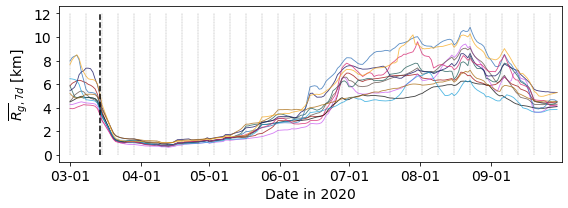

In [662]:
mobVar = "avgRgs"

# all cities in one
if mobVar=="avgRgs":
    plotMinV, plotMaxV = [0, 12]
if mobVar=="deltaKS":
    plotMinV, plotMaxV = [0.2, 1.0]
if mobVar=="KS_HBT":
    plotMinV, plotMaxV = [0.4, 0.9]

lockdownIdx = allDays_str.index("2020-03-14")

# plot change of KS by day
fig = plt.figure(figsize=(8, 3))
ax = plt.subplot(1, 1, 1)
for city in cities_spain:
    X = range(len(allDays_str))
    if mobVar == "avgRgs":
        Y = [np.nanmean(cities_avgRgs_dict[city][allDays_str[x]]) for x in X]
    if mobVar == "deltaKS":
        Y = [np.nanmean(cities_deltaKS_dict[city][allDays_str[x]]) for x in X]
    if mobVar == "KS_HBT":
        Y = [np.nanmean(cities_KS_HBT_dict[city][allDays_str[x]]) for x in X]

    plt.plot(X, Y, # marker="o", 
        marker=cityMarkers[city], markersize=0.0,
        markeredgecolor=cityColors[city], markeredgewidth=1, \
        markerfacecolor='#ffffff', linewidth=0.85, c=cityColors[city], \
        alpha=0.75, label=city)

# plot line every week
for d in range(len(allDays_str)):
    if d%7 != 0:
        continue
    plt.plot([d,d], [plotMinV, plotMaxV], lw=0.3, linestyle="--", c="#666666")

plt.plot([lockdownIdx,lockdownIdx], [plotMinV, plotMaxV], lw=1.5, linestyle="--", c="k")

# plt.ticklabel_format(axis="both", style="", scilimits=(0,0))
plt.xlim(-5, 215)
# plt.ylim(0, 1)
plt.xticks(firstDayIdx, firstDayInMonth, fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Date in 2020", fontsize=14)
if mobVar == "avgRgs":
    plt.ylabel(r"$\overline{R_g}_{,7d}$ [km]", fontsize=14)
if mobVar == "deltaKS":
    plt.ylabel(r"$\Delta \ KS_{7d}$", fontsize=14)
if mobVar == "KS_HBT":
    plt.ylabel(r"$KS_{HBT,7d}$", fontsize=14)

# plt.legend(loc="upper right", frameon=False, fontsize=12)
plt.tight_layout()
# plt.savefig(dataPath + 'results/secondWave/city_' + mobVar + '_all' + '.pdf')
# plt.close()

In [643]:
# calculating the correlation every 7 days
coorelation_results = []

for startDay in allDays[::7]:
    endDay = startDay + timedelta(days=7)


    covid_data_InSevenDays = dailyData_df[dailyData_df["date"] > startDay]
    covid_data_InSevenDays = covid_data_InSevenDays[covid_data_InSevenDays["date"] <= endDay]

    # print(startDay, endDay)

    # modling ability in each week
    # average R0 before LD
    rho_R0_avgRgs = np.corrcoef(covid_data_InSevenDays["avgRgs_week"], covid_data_InSevenDays["R0"])[0,1]
    rho_R0_deltaKS = np.corrcoef(covid_data_InSevenDays["deltaKS_week"], covid_data_InSevenDays["R0"])[0,1]
    rho_R0_KSHBT = np.corrcoef(covid_data_InSevenDays["KS_HBT_week"], covid_data_InSevenDays["R0"])[0,1]

    # how could the modeling ability change by time
    y, X = dmatrices(formular01, data=covid_data_InSevenDays, return_type='dataframe')
    gamma_model = sm.GLM(y, X, family=sm.families.Gaussian())
    gamma_results = gamma_model.fit()
    # print(gamma_results.summary())
    y_gt = list(y["R0"])
    y_pre = list(gamma_results.fittedvalues)
    # print("AIC = %.3f, Chi2 = %.3f" % (gamma_results.aic, gamma_results.pearson_chi2))
    # print("R2 = %.3f, Pearson = %.3f" % (r2_score(y_gt, y_pre), np.corrcoef(y_gt, y_pre)[0,1]))
    pearson01 = np.corrcoef(y_gt, y_pre)[0,1]

    # how could the modeling ability change by time
    y, X = dmatrices(formular02, data=covid_data_InSevenDays, return_type='dataframe')
    gamma_model = sm.GLM(y, X, family=sm.families.Gaussian())
    gamma_results = gamma_model.fit()
    # print(gamma_results.summary())
    y_gt = list(y["R0"])
    y_pre = list(gamma_results.fittedvalues)
    # print("AIC = %.3f, Chi2 = %.3f" % (gamma_results.aic, gamma_results.pearson_chi2))
    # print("R2 = %.3f, Pearson = %.3f" % (r2_score(y_gt, y_pre), np.corrcoef(y_gt, y_pre)[0,1]))
    pearson02 = np.corrcoef(y_gt, y_pre)[0,1]

    # how could the modeling ability change by time
    y, X = dmatrices(formular03, data=covid_data_InSevenDays, return_type='dataframe')
    gamma_model = sm.GLM(y, X, family=sm.families.Gaussian())
    gamma_results = gamma_model.fit()
    # print(gamma_results.summary())
    y_gt = list(y["R0"])
    y_pre = list(gamma_results.fittedvalues)
    # print("AIC = %.3f, Chi2 = %.3f" % (gamma_results.aic, gamma_results.pearson_chi2))
    # print("R2 = %.3f, Pearson = %.3f" % (r2_score(y_gt, y_pre), np.corrcoef(y_gt, y_pre)[0,1]))
    pearson03 = np.corrcoef(y_gt, y_pre)[0,1]

    # save results for visulization
    coorelation_results.append([startDay, rho_R0_avgRgs, rho_R0_deltaKS, rho_R0_KSHBT, 
                            pearson01, pearson02, pearson03])

coorelation_results = pd.DataFrame(coorelation_results, columns=["date", "rho_R0_avgRgs", "rho_R0_deltaKS", \
    "rho_R0_KSHBT", "pearson01", "pearson02", "pearson03"]) 

In [644]:
coorelation_results

,date,rho_R0_avgRgs,rho_R0_deltaKS,rho_R0_KSHBT,pearson01,pearson02,pearson03
0,2020-03-01,-0.157320,-0.210024,-0.264546,0.641410,0.721341,0.634616
1,2020-03-08,0.306823,0.061235,0.523566,0.802431,0.719369,0.832867
2,2020-03-15,0.816869,-0.151051,0.894504,0.875497,0.597816,0.934599
3,2020-03-22,0.094483,-0.102034,0.157071,0.652546,0.596250,0.758299
4,2020-03-29,-0.350209,-0.414326,-0.172981,0.603371,0.661361,0.631402
5,2020-04-05,-0.449245,-0.485979,-0.505415,0.698847,0.782964,0.650719
6,2020-04-12,0.319964,-0.123654,0.145997,0.653078,0.469935,0.570982
7,2020-04-19,0.078009,-0.159047,0.132045,0.454093,0.618861,0.602643
8,2020-04-26,0.056504,0.037703,-0.044583,0.383854,0.448699,0.366601
9,2020-05-03,-0.332470,0.003114,-0.269715,0.544329,0.369567,0.451980
